In [1]:
# !git clone https://github.com/huggingface/diffusers

In [2]:
cd diffusers


/home/yagor/Рабочий стол/biometric hands gen hack/diffusers


In [3]:
# pip install .

In [4]:
cd examples/text_to_image


/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image


In [5]:
# pip install -r requirements.txt

In [6]:
from accelerate.utils import write_basic_config

write_basic_config()


Configuration already exists at /home/yagor/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.


False

In [7]:
# !accelerate launch train_text_to_image.py \
#  --snr_gamma=5.0

In [8]:
# !export MODEL_NAME="runwayml/stable-diffusion-v1-5"
# !export dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/Hands"



In [9]:
import pandas as pd

In [10]:
d = pd.read_csv("/home/yagor/Рабочий стол/biometric hands gen hack/Hands/metadata.csv", index_col=0)

In [11]:
d

,text
file_name,
Hand_0000038.jpg,"realystic photo all palmer, white background"
Hand_0000039.jpg,"realystic photo all palmer, white background"
Hand_0000040.jpg,"realystic photo all palmer, white background"
Hand_0000041.jpg,"realystic photo all palmer, white background"
Hand_0000042.jpg,"realystic photo all palmer, white background"
...,...
Hand_0011740.jpg,"realystic photo all palmer, white background"
Hand_0011741.jpg,"realystic photo all palmer, white background"
Hand_0011742.jpg,"realystic photo all palmer, white background"


In [12]:
from datasets import load_dataset
# dataset = load_dataset("imagefolder", data_dir="/home/yagor/Рабочий стол/biometric hands gen hack/Hands")
# dataset = load_dataset("imagefolder", data_dir="/home/yagor/Рабочий стол/biometric hands gen hack/Hands")

In [13]:
# dataset

In [14]:
# import json
# from pathlib import Path
# #https://dev.to/dangattringer/step-by-step-guide-loading-a-huggingface-controlnet-dataset-from-a-local-path-3927
# def create_metadata(data_dir, output_file):
#     metadata = []
#     try:
#         with open(f"{data_dir}/captions.jsonl", "r") as f:
#             for line in f:
#                 data = json.loads(line)
#                 file_name = Path(data["file_name"]).name
#                 metadata.append(
#                     {
#                         "image": data["image"],
#                         "text": data["text"],
#                     }
#                 )

#         with open(f"{data_dir}/metadata.jsonl", "w") as f:
#             for line in metadata:
#                 f.write(json.dumps(line) + "\n")
#     except (FileNotFoundError, json.JSONDecodeError) as e:
#         print(f"Error processing data: {e}")

# # Example usage:
# data_dir = "my_dataset/data"
# create_metadata(data_dir)

In [15]:
# pip install --upgrade Pillow

In [16]:
import PIL
PIL.__version__ #runwayml/stable-diffusion-v1-5

'10.4.0'

In [18]:
!accelerate launch train_unconditional.py \
  --dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train" \
  --output_dir="ddpm-ema-palm-512" \
  --mixed_precision="fp16" \
  --resolution=512 \
  --checkpointing_steps=1000

/home/yagor/anaconda3/envs/torch/bin/python: can't open file '/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/train_unconditional.py': [Errno 2] No such file or directory
Traceback (most recent call last):
  File "/home/yagor/anaconda3/envs/torch/bin/accelerate", line 8, in <module>
    sys.exit(main())
  File "/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/accelerate/commands/accelerate_cli.py", line 48, in main
    args.func(args)
  File "/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/accelerate/commands/launch.py", line 1168, in launch_command
    simple_launcher(args)
  File "/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/accelerate/commands/launch.py", line 763, in simple_launcher
    raise subprocess.CalledProcessError(returncode=process.returncode, cmd=cmd)
subprocess.CalledProcessError: Command '['/home/yagor/anaconda3/envs/torch/bin/python', 'train_unconditional.py', '--dataset_name=/home/yagor/Рабочи

In [24]:
# export MODEL_NAME="runwayml/stable-diffusion-v1-5"
# export OUTPUT_DIR="/sddata/finetune/lora/naruto"
# export HUB_MODEL_ID="naruto-lora"
# export DATASET_NAME="lambdalabs/naruto-blip-captions"

!accelerate launch --mixed_precision="fp16"  train_text_to_image_lora.py \
  --mixed_precision="fp16" \
  --pretrained_model_name_or_path="/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/fingers_full_white_back_only_plus10000" \
  --dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train" \
  --dataloader_num_workers=8 \
  --resolution=512 \
  --center_crop \
  --random_flip \
  --train_batch_size=1 \
  --gradient_accumulation_steps=4 \
  --max_train_steps=20000 \
  --learning_rate=1e-04 \
  --max_grad_norm=1 \
  --lr_scheduler="cosine" \
  --lr_warmup_steps=0 \
  --output_dir="lora" \
  --checkpointing_steps=5000 \
  --validation_prompt="realystic photo palmer with fingers, white background, only five realystic fingers" \
  --seed=1337

/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
10/11/2024 01:08:17 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

{'dynamic_thresholding_ratio', 'clip_sample_range', 'rescale_betas_zero_snr', 'thresholding', 'variance_type', 'sample_max_value'} was not fo

In [1]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained("/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/fingers_full_white_back_only", safety_checker = None,torch_dtype=torch.float16).to("cuda")
pipeline.load_lora_weights("/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/lora", weight_name="pytorch_lora_weights.safetensors")


/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [2]:
pipeline.push_to_hub("sd_15_unet_and_lora_train")

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Upload 3 LFS files:   0%|          | 0/3 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/Yagorka/sd_15_unet_and_lora_train/commit/4b556095818f9aa104a9b05b675fb452186ff47d', commit_message='Upload StableDiffusionPipeline', commit_description='', oid='4b556095818f9aa104a9b05b675fb452186ff47d', pr_url=None, pr_revision=None, pr_num=None)

In [92]:
image = pipeline("realystic photo palmer with fingers, with big scar on palm, skin scarring").images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

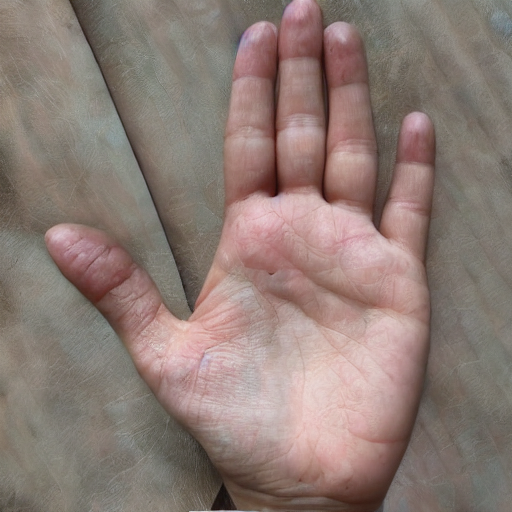

In [93]:
image

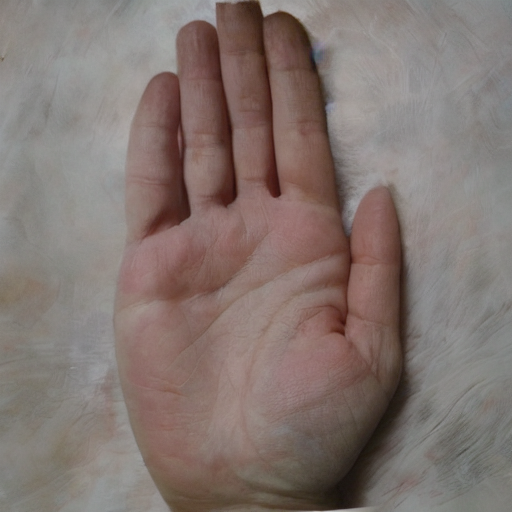

In [85]:
image

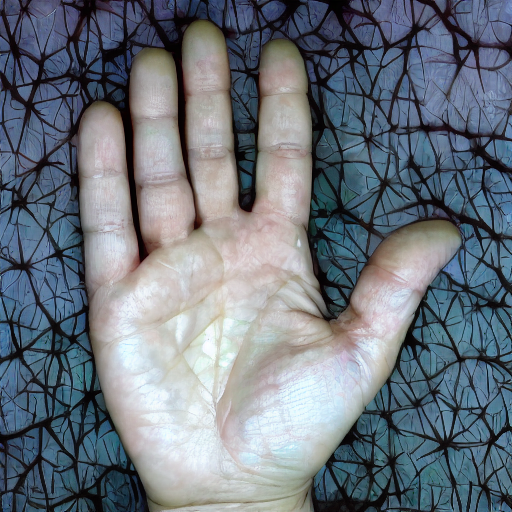

In [62]:
image

In [17]:
# !accelerate launch --mixed_precision="fp16"  train_text_to_image.py \
#   --pretrained_model_name_or_path="/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/sd-palm-model" \
#   --dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/Hands" \
#   --use_ema \
#   --resolution=512 --center_crop \
#   --train_batch_size=1 \
#   --gradient_accumulation_steps=4 \
#   --gradient_checkpointing \
#   --max_train_steps=10000 \
#   --checkpointing_steps=10000 \
#   --learning_rate=1e-05 \
#   --max_grad_norm=1 \
#   --snr_gamma=5.0 \
#   --enable_xformers_memory_efficient_attention \
#   --lr_scheduler="constant" --lr_warmup_steps=0 \
#   --output_dir="sd-palm-model"

In [18]:
!accelerate launch --mixed_precision="fp16"  train_text_to_image.py \
  --pretrained_model_name_or_path="/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/fingers_full_white_back_only" \
  --dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train" \
  --use_ema \
  --resolution=512 --center_crop \
  --train_batch_size=1 \
  --gradient_accumulation_steps=4 \
  --gradient_checkpointing \
  --max_train_steps=10000 \
  --checkpointing_steps=10000 \
  --learning_rate=1e-05 \
  --max_grad_norm=1 \
  --snr_gamma=5.0 \
  --enable_xformers_memory_efficient_attention \
  --lr_scheduler="constant" --lr_warmup_steps=0 \
  --output_dir="fingers_full_white_back_only_plus10000"

/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
10/10/2024 19:50:02 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

{'thresholding', 'variance_type', 'dynamic_thresholding_ratio', 'clip_sample_range', 'rescale_betas_zero_snr', 'sample_max_value'} was not fo

In [14]:
# !accelerate launch --mixed_precision="fp16"  train_text_to_image.py \
#   --pretrained_model_name_or_path="/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/sd-palm-model_new_fingers_full" \
#   --dataset_name="/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train" \
#   --use_ema \
#   --resolution=512 --center_crop \
#   --train_batch_size=1 \
#   --gradient_accumulation_steps=4 \
#   --gradient_checkpointing \
#   --max_train_steps=20000 \
#   --checkpointing_steps=20000 \
#   --learning_rate=1e-05 \
#   --max_grad_norm=1 \
#   --snr_gamma=5.0 \
#   --enable_xformers_memory_efficient_attention \
#   --lr_scheduler="constant" --lr_warmup_steps=0 \
#   --output_dir="sd-palm-model_new_fingers_full_white_back"

/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:211: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_fwd")
/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/xformers/ops/fmha/flash.py:344: FutureWarning: `torch.library.impl_abstract` was renamed to `torch.library.register_fake`. Please use that instead; we will remove `torch.library.impl_abstract` in a future version of PyTorch.
  @torch.library.impl_abstract("xformers_flash::flash_bwd")
10/10/2024 00:58:59 - INFO - __main__ - Distributed environment: NO
Num processes: 1
Process index: 0
Local process index: 0
Device: cuda

Mixed precision type: fp16

{'clip_sample_range', 'dynamic_thresholding_ratio', 'variance_type', 'thresholding', 'sample_max_value', 'rescale_betas_zero_snr'} was not fo

In [21]:
ls

README.md                   test_text_to_image.py
README_sdxl.md              train_text_to_image_flax.py
requirements_flax.txt       train_text_to_image_lora.py
requirements_sdxl.txt       train_text_to_image_lora_sdxl.py
requirements.txt            train_text_to_image.py
sd-palm-model/              train_text_to_image_sdxl.py
test_text_to_image_lora.py


In [34]:
from diffusers import StableDiffusionPipeline
import torch

pipeline = StableDiffusionPipeline.from_pretrained('/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/fingers_full_white_back_only', safety_checker = None,torch_dtype=torch.float16, use_safetensors=True).to("cuda")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [149]:
negative_promt = 'six fingers, disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w'
image = pipeline(prompt="female palmar left, fair skin, ultra quality, realystic, white background, five fingers", negative_prompt=negative_promt).images[0]
image.save("male-palm9.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# generator=torch.Generator("cuda").manual_seed(12)

In [83]:
negative_promt = 'disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w'
image = pipeline(prompt="realystic photo beautifull palm with fingers, white background, beautiful lighting", negative_prompt=negative_promt).images[0]
image.save("male-palm99.png")

  0%|          | 0/50 [00:00<?, ?it/s]

In [ ]:
# pipeline.push_to_hub("sd_palm_finetune")

In [172]:
del pipeline

In [31]:
from diffusers import StableDiffusionPipeline
import torch

pipeline = StableDiffusionPipeline.from_pretrained("Yagorka/sd_palm_finetune", subfolder='checkpoint-10000', torch_dtype=torch.float16, safety_checker = None, use_safetensors=True).to("cuda")
negative_promt = 'disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w'
image = pipeline(prompt="male palmar left, fair skin, ultra quality, realystic, white background", negative_prompt=negative_promt).images[0]

Keyword arguments {'subfolder': 'checkpoint-10000'} are not expected by StableDiffusionPipeline and will be ignored.


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


  0%|          | 0/50 [00:00<?, ?it/s]

In [653]:
prompt = "realystic photo palmar left, skin, ultra quality realystic, white background, five fingers"#photo male palm left
negative_prompt = 'disfigured, ugly, bad, immature, cartoon, anime, 3d, painting, b&w, six fingers'

In [84]:
# negative_promt = 'disfigured, mutated hand, mutated fingers, bad fingers, many fingers, ugly, immature, cartoon, anime, 3d, painting, b&w, bad photo, bad photography, bad hands, bad anatomy, bad body, bad art:1.4, not realistic'
# negative_promt = 'disfigured, mutated hand, mutated fingers, bad fingers, not skin color, many fingers, ugly, immature, cartoon, anime, 3d, painting, bad photo, bad photography, bad hands, bad anatomy, bad body, not realistic'
# prompt="realystic photo palmer with fingers, white background, only five realystic fingers, pretty skin color hand, good lighting"
# guidance_scale= 10.7

In [67]:
# lora
# negative_promt = 'disfigured, mutated hand, mutated fingers, bad fingers, many fingers, ugly, immature, cartoon, anime, 3d, painting, b&w, bad photo, bad photography, bad hands, bad anatomy, bad body, bad art:1.4, not realistic'
negative_promt = 'dark, disfigured, mutated hand, many fingers, ugly, immature, cartoon, anime, 3d, painting, bad photo, bad photography, bad hands, bad anatomy, bad body, not realistic'
prompt="realystic photo palmer with fingers, white background, only five realystic fingers, overhead white lighting without shadow"
# guidance_scale= 10.7

In [105]:
from diffusers import AutoPipelineForText2Image
import torch

pipeline = AutoPipelineForText2Image.from_pretrained("/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/fingers_full_white_back_only_plus10000", safety_checker = None,torch_dtype=torch.float16).to("cuda")
pipeline.load_lora_weights("/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/lora", weight_name="pytorch_lora_weights.safetensors")


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [86]:
image = pipeline("realystic photo palmer with fingers, white background, only five realystic fingers").images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

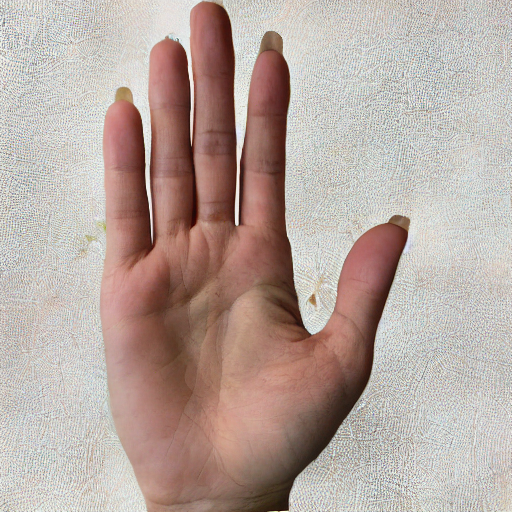

In [87]:
image

In [98]:
# lora
# negative_promt = 'disfigured, mutated hand, mutated fingers, bad fingers, many fingers, ugly, immature, cartoon, anime, 3d, painting, b&w, bad photo, bad photography, bad hands, bad anatomy, bad body, bad art:1.4, not realistic'
negative_promt = 'dark, disfigured, mutated hand, many fingers, ugly, immature, cartoon, anime, 3d, painting, bad photo, bad photography, bad hands, bad anatomy, bad body, not realistic'
prompt="realystic photo palmer with fingers, white background, only five realystic fingers"
# guidance_scale= 10.7

In [77]:
def get_inputs(batch_size=1, start_seed=13):                                                                                                                                                                                                                 
  generator = [torch.Generator("cuda").manual_seed(i+start_seed) for i in range(batch_size)]                                                                                                                                             
  prompts = batch_size * [prompt]
  negative_promts = batch_size * [negative_promt]                                                                                                                                                                                                             
  num_inference_steps = 50 
  guidance_scale=10                                                                                                                                                                                                                  
  #"num_inference_steps": num_inference_steps,"guidance_scale":guidance_scale,"negative_promt":negative_promts,
  return {"prompt": prompts, "generator": generator,    }     #,                                                                                                                                         

In [57]:
#7.5-12 
# num_inference_steps  = 50 #30-50

In [58]:
t = torch.cuda.get_device_properties(0).total_memory
r = torch.cuda.memory_reserved(0)
a = torch.cuda.memory_allocated(0)

In [59]:
f = r-a

In [98]:
torch.cuda.mem_get_info()

(14674886656, 25378160640)

In [6]:
from tqdm import tqdm

In [78]:
directory = 'gen_data_sd-palm-fingers_full_white_back_only_plus10000+lorat3scale'
import os
if not os.path.exists(directory):
    os.makedirs(directory)
def generate_images(n, batch_size, start_seed=1000):

    num = n//batch_size

    for j in tqdm(range(num)):
        images_all = pipeline(**get_inputs(batch_size=batch_size, start_seed=start_seed))
        for k, image in enumerate(images_all.images):
            image.save(os.path.join(directory, f'{j}_{k}.jpg'))
        start_seed+=batch_size
    if n-num*batch_size>0:
        images_all = pipeline(**get_inputs(batch_size=n-num*batch_size, start_seed=start_seed))
        for k, image in enumerate(images_all.images):
            image.save(os.path.join(directory, f'{num}_{k}.jpg'))



In [99]:
def get_inputs2(batch_size=1, start_seed=13):                                                                                                                                                                                                                 
#   generator = [torch.Generator("cuda").manual_seed(i+start_seed) for i in range(batch_size)]                                                                                                                                             
  prompts = batch_size * [prompt]
  negative_promts = batch_size * [negative_promt]                                                                                                                                                                                                             
  num_inference_steps = 50 
  guidance_scale=10                                                                                                                                                                                                                  
  #"num_inference_steps": num_inference_steps,"guidance_scale":guidance_scale,,
  return {"prompt": prompts, "negative_promt":negative_promts}#, "generator": generator,    }     #,

In [100]:
directory = 'gen_data_sd-palm-fingers_full_white_back_only_plus10000+loratsed_withgen'
import os
if not os.path.exists(directory):
    os.makedirs(directory)
def generate_images(n, batch_size, start_seed=1000):
    torch.manual_seed(start_seed)
    torch.cuda.manual_seed(start_seed)
    num = n//batch_size
    for j in tqdm(range(num)):
        images_all = pipeline(**get_inputs2(batch_size=batch_size, start_seed=start_seed))
        for k, image in enumerate(images_all.images):
            image.save(os.path.join(directory, f'{j}_{k}.jpg'))
        start_seed+=batch_size
    if n-num*batch_size>0:
        images_all = pipeline(**get_inputs2(batch_size=n-num*batch_size, start_seed=start_seed))
        for k, image in enumerate(images_all.images):
            image.save(os.path.join(directory, f'{num}_{k}.jpg'))




In [121]:
generate_images(n=200, batch_size=5, start_seed=30)

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  2%|▎         | 1/40 [00:05<03:20,  5.14s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  5%|▌         | 2/40 [00:10<03:15,  5.14s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

  8%|▊         | 3/40 [00:15<03:10,  5.14s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|█         | 4/40 [00:20<03:05,  5.15s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 12%|█▎        | 5/40 [00:25<03:00,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 15%|█▌        | 6/40 [00:30<02:55,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 18%|█▊        | 7/40 [00:36<02:50,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 8/40 [00:41<02:44,  5.15s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 22%|██▎       | 9/40 [00:46<02:39,  5.15s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 25%|██▌       | 10/40 [00:51<02:34,  5.15s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 28%|██▊       | 11/40 [00:56<02:30,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|███       | 12/40 [01:02<02:25,  5.20s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 32%|███▎      | 13/40 [01:07<02:20,  5.19s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 35%|███▌      | 14/40 [01:12<02:14,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 38%|███▊      | 15/40 [01:17<02:09,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 16/40 [01:22<02:03,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 42%|████▎     | 17/40 [01:27<01:58,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 45%|████▌     | 18/40 [01:32<01:53,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 48%|████▊     | 19/40 [01:38<01:48,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 20/40 [01:43<01:43,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 52%|█████▎    | 21/40 [01:48<01:38,  5.19s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 55%|█████▌    | 22/40 [01:53<01:33,  5.20s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 57%|█████▊    | 23/40 [01:59<01:28,  5.21s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 24/40 [02:04<01:23,  5.22s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 62%|██████▎   | 25/40 [02:09<01:18,  5.20s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 65%|██████▌   | 26/40 [02:14<01:12,  5.18s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 68%|██████▊   | 27/40 [02:19<01:07,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|███████   | 28/40 [02:24<01:02,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 72%|███████▎  | 29/40 [02:30<00:57,  5.19s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 75%|███████▌  | 30/40 [02:35<00:51,  5.20s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 78%|███████▊  | 31/40 [02:40<00:46,  5.19s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 32/40 [02:45<00:41,  5.19s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 82%|████████▎ | 33/40 [02:50<00:36,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 85%|████████▌ | 34/40 [02:56<00:31,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 88%|████████▊ | 35/40 [03:01<00:25,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|█████████ | 36/40 [03:06<00:20,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 92%|█████████▎| 37/40 [03:11<00:15,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 95%|█████████▌| 38/40 [03:16<00:10,  5.16s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 98%|█████████▊| 39/40 [03:21<00:05,  5.17s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 40/40 [03:27<00:00,  5.18s/it]


In [122]:
import os
# Get the list of all files and directories
path = directory
dir_list = os.listdir(path)
print("Files and directories in '", path, "' :")
# prints all files
print(len(dir_list))

Files and directories in ' gen_data_sd-palm-fingers_full_white_back_only_plus10000+loratsed_withgen ' :
200


## Calculated fid

In [ ]:
ima = Image.open('/home/yagor/Рабочий стол/biometric hands gen hack/dataset/test/006-ZsWPVl4f3t95Alvp1zK4Mz4evvWHHcwleU6FLqsG9xl_oyUC1jMvUDQ0LJnNjQ42THOEt3tgf0FVv-GvMjPSce.jpg')

In [ ]:
test_512_dir = 'train_512'
base_test_dir = '/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train'
if not os.path.exists(test_512_dir):
    os.makedirs(test_512_dir)
for n, i in enumerate(os.listdir(base_test_dir)):
    with Image.open(os.path.join(base_test_dir, i)) as im:
        try:
            resized = im.resize((512,512))
            resized.save(os.path.join(test_512_dir, str(n)+".jpg"))
        except Exception as ex:
            print(i)
            print(ex)



UnidentifiedImageError: cannot identify image file '/home/yagor/Рабочий стол/biometric hands gen hack/dataset/train/metadata.csv'

In [265]:
!pip install pytorch-fid

In [270]:
import subprocess
command = "ipconfig"
output = subprocess.check_output(!python -m pytorch_fid /home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/test_512 /home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/gen_data_sd-palm-fingers_full_white_back_only_plus10000+lorat)

SyntaxError: invalid syntax (2738774279.py, line 3)

In [1]:
!python -m pytorch_fid "/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/test_512" "gen_data_sd-palm-fingers_full_white_back_only_plus10000+loratsed_withgen"

100%|█████████████████████████████████████████████| 4/4 [00:00<00:00,  5.47it/s]
FID:  103.516838562305


In [276]:
!python -m pytorch_fid "/home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid/train_512" "/home/yagor/Рабочий стол/biometric hands gen hack/result"

100%|█████████████████████████████████████████████| 2/2 [00:00<00:00,  3.45it/s]
FID:  56.46964913812657


In [277]:
!python -m pytorch_fid "/home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid/train_512" "/home/yagor/Рабочий стол/biometric hands gen hack/result (1)"

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  3.87it/s]
FID:  58.912278989579825


In [279]:
!python -m pytorch_fid "/home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid/train_512" "/home/yagor/Рабочий стол/biometric hands gen hack/result (2)"

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  2.75it/s]
FID:  43.683445227586745


In [278]:
!python -m pytorch_fid "/home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid/train_512" "/home/yagor/Рабочий стол/biometric hands gen hack/diffusers/examples/text_to_image/test_512"

100%|███████████████████████████████████████████| 14/14 [00:01<00:00,  8.51it/s]
FID:  10.000985715686781


In [261]:
cd /home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid

/home/yagor/Рабочий стол/biometric hands gen hack/pytorch_fid


In [264]:
from pytorch_fid import 

ImportError: cannot import name 'calculate_fid_given_paths' from 'pytorch_fid' (/home/yagor/anaconda3/envs/torch/lib/python3.9/site-packages/pytorch_fid/__init__.py)

In [263]:
import pytorch_fid.calculate_fid_given_paths

ModuleNotFoundError: No module named 'pytorch_fid.calculate_fid_given_paths'

In [ ]:
batch_size = 50
device=None
num_workers=None

In [ ]:
if device is None:
    device = torch.device("cuda" if (torch.cuda.is_available()) else "cpu")
else:
    device = torch.device(device)

if num_workers is None:
    try:
        num_cpus = len(os.sched_getaffinity(0))
    except AttributeError:
        # os.sched_getaffinity is not available under Windows, use
        # os.cpu_count instead (which may not return the *available* number
        # of CPUs).
        num_cpus = os.cpu_count()

    num_workers = min(num_cpus, 8) if num_cpus is not None else 0
else:
    num_workers = num_workers

# if save_stats:
#     save_fid_stats(path, batch_size, device, dims, num_workers)
#     return

fid_value = calculate_fid_given_paths(
    path, batch_size, device, 2048, num_workers
)

## Show images

In [119]:
import matplotlib.pyplot as plt 
from PIL import Image

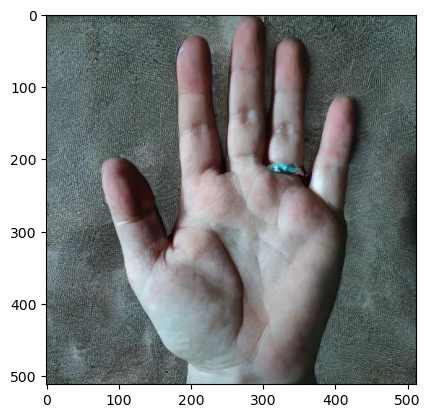

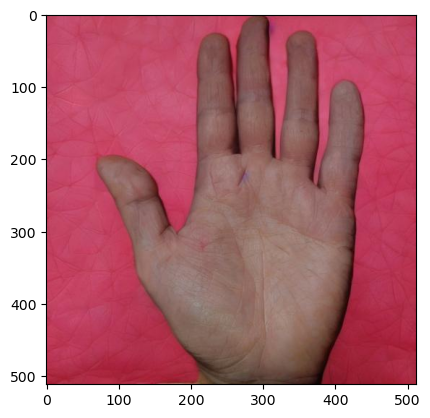

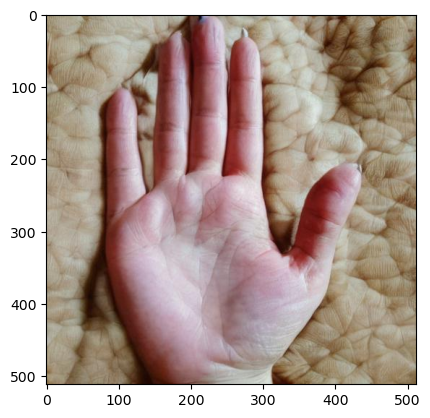

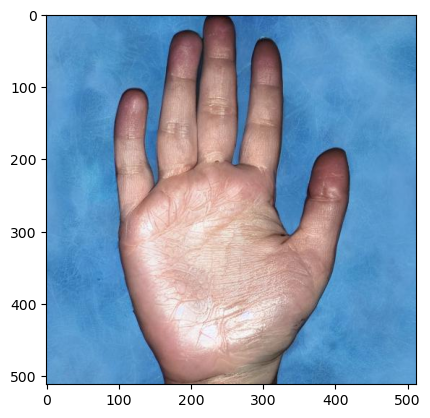

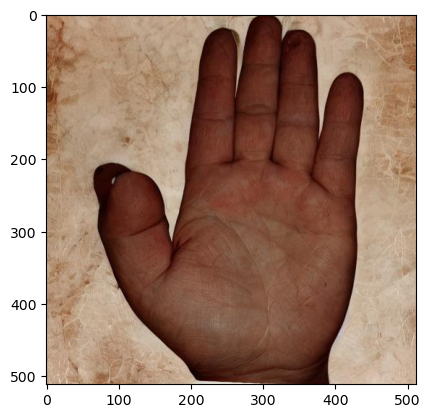

...

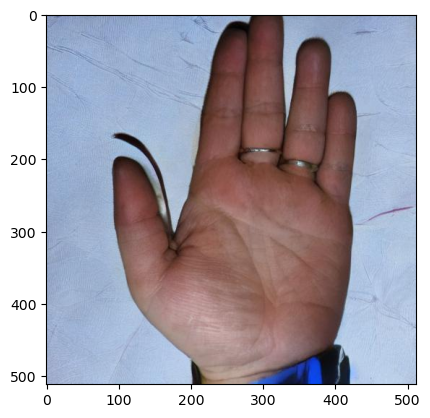

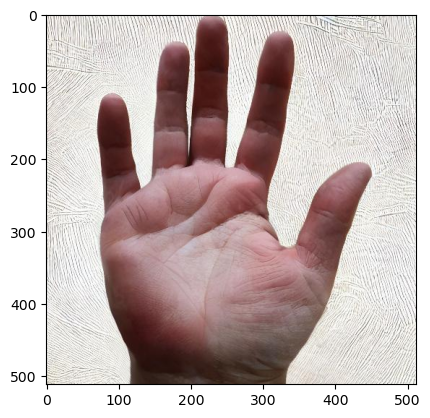

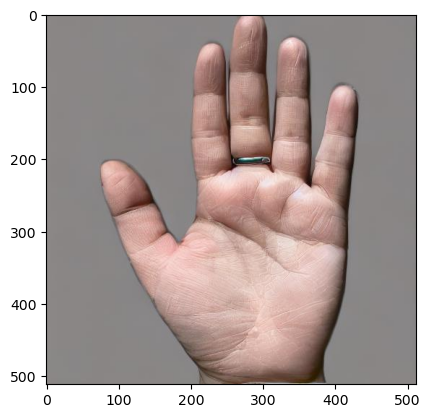

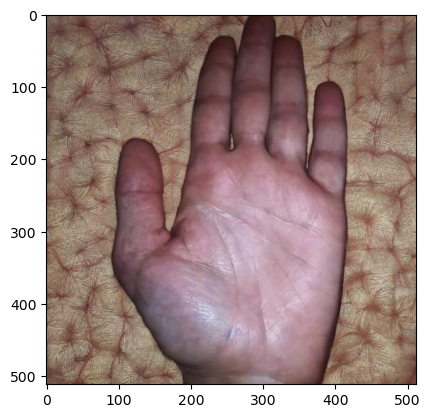

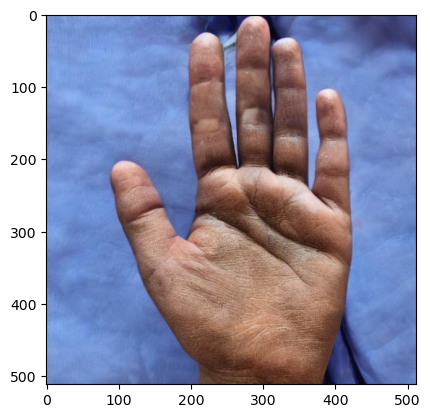

In [120]:
for i in dir_list[:100]:
    raw_image = Image.open(os.path.join(path, i)).convert('RGB')
    plt.imshow(raw_image)
    plt.show()

In [133]:
images_all = pipeline(**get_inputs(batch_size=4), guidance_scale=guidance_scale)

  0%|          | 0/50 [00:00<?, ?it/s]

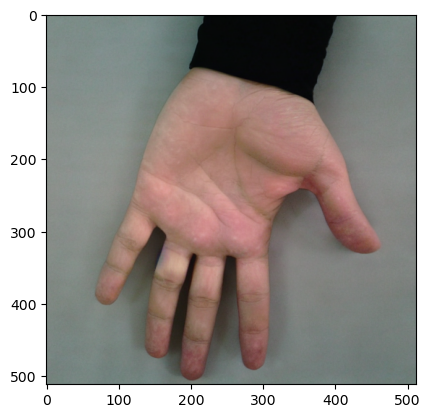

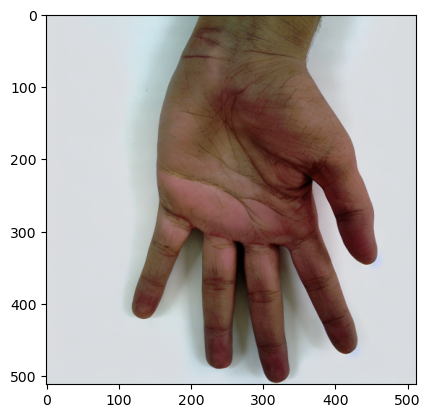

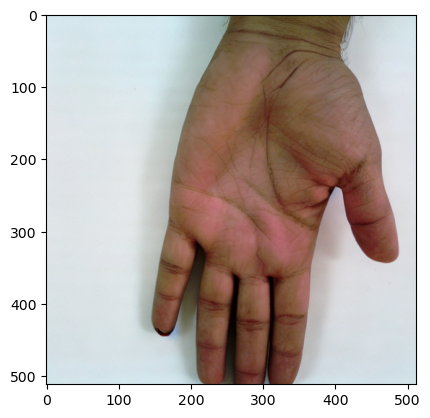

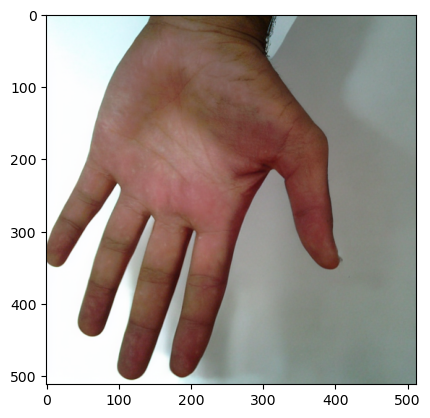

In [615]:
for i in images_all.images:
    plt.imshow(i)
    plt.show()

In [531]:
im = images_all.images[1]

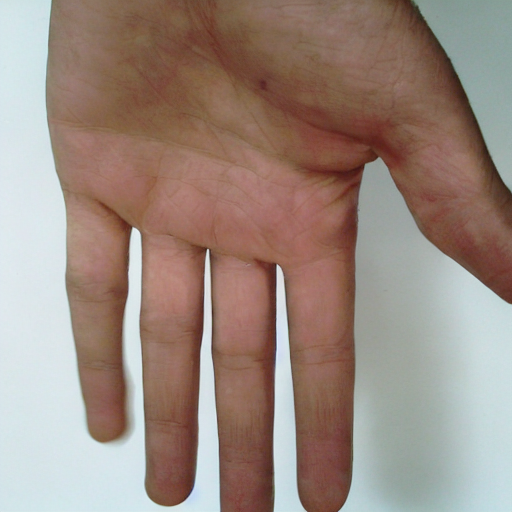

In [512]:
im

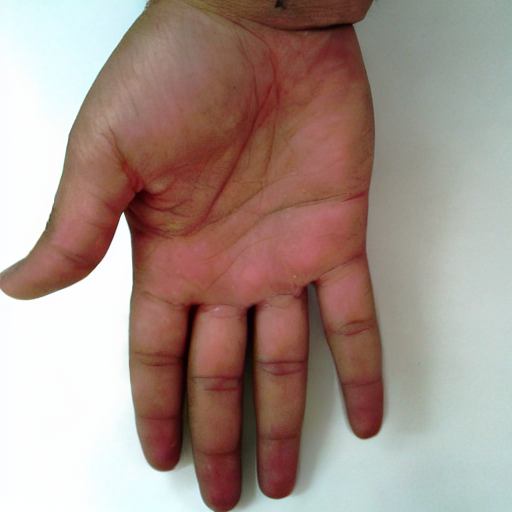

In [351]:
images_all.images[3]